# Implementation of a containment zone

In [ ]:
import numpy as np
import time
import torch
device = 'cuda'

start = time.time()

# Total Population
Population = 400
# Children, Adults, Seniors, Infections
Layout = np.array([0,1000],dtype=np.int)
Demography = np.array([0.27*Population,0.633*Population,0.097*Population,0.01*Population],dtype=np.int)
Containment = np.array([0,200,600,200,600],dtype=np.int) # Population(0), Cxmin(1), Cxmax(2), Cymin(3), Cymax(4)
MembersContainment = torch.tensor([],device='cuda',dtype=torch.long)
Containment[0] = np.int16((Population*(Containment[2]-Containment[1])*(Containment[4]-Containment[3]))/(Layout[1]*Layout[1]))
# Total time (days), Resolution(minutes)
Time = np.array([21,15],dtype=np.int) 
# TimeSteps in a day (1 step = 15mins) and total
TimeStepsDay = int(np.divide(24*60,Time[1]))
TimeStepsTotal = int(TimeStepsDay*Time[0])
# Disease States: SIT/SIN/AIT/AIN/SUT/SUN
States = torch.tensor(([0,0,0,0,0,1,2,3],[0,0,0,1,0,0,0,0],[6,7,6,7,0,0,0,0],[9,9,9,9,0,0,0,0],[0,0,0,0,0,0,0,0],[0,1,2,3,4,5,6,7]),dtype=torch.int,device='cuda')
# Disease Transition Probabilities
Transition = torch.zeros((3,6,8),dtype=torch.double)
Transition[0] = torch.transpose(torch.tensor(([0,0,0.12495,0.00005,0,0.875],[0,0,0.09994,0.00006,0,0.9],[0,0.00998,0.19,0.00002,0,0.8],[0,0.02996,0.12,0.00004,0,0.85],
                                              [0.2537,0,0,0,0,0.7463],[0.2537,0,0,0,0,0.7463],[0.2537,0,0,0,0,0.7463],[0.2537,0,0,0,0,0.7463]),dtype=torch.double,device='cuda'),0,1) 
Transition[1] = torch.transpose(torch.tensor(([0,0,0.124,0.001,0,0.875],[0,0,0.06,0.04,0,0.9],[0,0.03993,0.16,0.00007,0,0.8],[0,0.0493,0.1,0.0007,0,0.85],
                                              [0.5,0,0,0,0,0.5],[0.5,0,0,0,0,0.5],[0.5,0,0,0,0,0.5],[0.5,0,0,0,0,0.5]),dtype=torch.double,device='cuda'),0,1) 
Transition[2] = torch.transpose(torch.tensor(([0,0,0.065,0.06,0,0.875],[0,0,0.02,0.08,0,0.9],[0,0.08,0.1,0.02,0,0.8],[0,0.1,0.01,0.04,0,0.85],
                                              [0.5951,0,0,0,0,0.4049],[0.5951,0,0,0,0,0.4049],[0.5951,0,0,0,0,0.4049],[0.5951,0,0,0,0,0.4049]),dtype=torch.double,device='cuda'),0,1)
permeability = 0.5*np.ones(11)#np.arange(0,1.1,step=0.1)
MonteCarlo = 1
# Storage Parameters
# Outermost Loop (Scenario/Final Parameters)
# Disease Transmission: S/IT/INT/R/D/Total (7+7, Mean and Variance states), Effective Rep Number (Mean,Variance)(14,15), ContactRate (Mean, Variance)(16,17), ContactProbability (Mean,Variance)(18,19)
FinalTimeSeries = torch.zeros(len(permeability),93,TimeStepsTotal+1, dtype=torch.float,device='cuda')
# Reproduction Number (Overall,Basic) (Mean - 0,1, Variance - 2,3), Time to infection, death, recovery (Mean - 4,5,6, Variance - 7,8,9)
FinalConstants = torch.zeros(len(permeability),18,1, dtype=torch.float,device='cuda')
for i in range(len(permeability)):
  # Second Loop (MonteCarlo Run Parameters)
  # ResultsTimeSeries (Time Series for MC runs)(0-6), Effective Reproduction Number of each run(7), ContactRate(8), ContactProbability(9)
  ResultsTMC = torch.zeros((MonteCarlo,46,TimeStepsTotal+1), dtype=torch.float,device='cuda')
  # Results Constants: Reproduction Number (Overall(0), Basic(1)),Time to Infection: Overall(2), Recovery(3), Death(4)
  ResultsCMC = torch.zeros((MonteCarlo,9,1), dtype=torch.float,device='cuda')
  for k in range(MonteCarlo):
    # Create N Agents
    # Age=0,InfectionHour=1,InfectionDay=2,InfectionState=3,InfectionStatus=4,Containment=5,
    # SocialDistance=6,PositionX=7,PositionY=8,GoalX=9,GoalY=10,GoalFollow=11,VelocityX=12,
    # VelocityY=13,MinVelocity=14,MaxVelocity=15,InfectionRadius=16,CriticalRadius=17,
    # Contacts=18,Uninfected=19,Containmentbreach=20
    Agents = torch.zeros((Population,21),dtype=torch.double,device='cuda')
    ####################################################################################################################
    # Assign Age of Agents
    Agents[:,0] = torch.tensor([0,1,2],device='cuda')[torch.multinomial(torch.tensor([0.27,0.633,0.097]),Population,replacement=True)]
    Children = torch.where(Agents[:,0]==0)[0]
    Adults = torch.where(Agents[:,0]==1)[0]
    Seniors = torch.where(Agents[:,0]==2)[0]
    #####################################################################################################################
    # Assign infection_status
    # 4.18% infections among children, 83.96% infections among adults, 11.86% among seniors
    pick = torch.tensor([0,1,2],device='cuda')[torch.multinomial(torch.tensor([0.0418,0.8396,0.1186]),Demography[3],replacement=True)]
    Agents[Children[torch.where(pick==0)],4] = 1
    Agents[Adults[torch.where(pick==1)],4] = 1
    Agents[Seniors[torch.where(pick==2)],4] = 1
    # To keep account of initial infections
    Indices = torch.zeros((Population),dtype=torch.long,device='cuda')
    Indices[torch.where(Agents[:,4]==1)] = 1
    #####################################################################################################################
    # Assign infection_state
    # SIT=0, SIN=1, AIT=2, AIN=3, SUT=4, SUN=5, AUT=6, AUN=7
    # Infected
    # 80% of the infections are asymptomatic
    # 20% of the infections are symptomatic
    pick = torch.tensor([True,False],device='cuda')[torch.multinomial(torch.tensor([0.8,0.2]),Demography[3],replacement=True)]
    Agents[torch.where(Agents[:,4]==1)[0][torch.where(pick==True)[0]],3] = 3
    Agents[torch.where(Agents[:,4]==1)[0][torch.where(pick==False)[0]],3] = 1
    # Uninfected
    # 85% of the uninfected are asymptomatic
    # 15% of the uninfected are symptomatic
    pick = torch.tensor([True,False],device='cuda')[torch.multinomial(torch.tensor([0.85,0.15]),Population-Demography[3],replacement=True)]
    Agents[torch.where(Agents[:,4]==0)[0][torch.where(pick==True)[0]],3] = 7 # AUN
    Agents[torch.where(Agents[:,4]==0)[0][torch.where(pick==False)[0]],3] = 5 # SUN
    ########################################################################################################################################################################################################
    # Assign agents belonging to containment zones and their positions
    MembersContainment = torch.tensor([],device='cuda',dtype=torch.long)
    MembersContainment = torch.cat((MembersContainment,torch.where(Agents[:,4]==1)[0]),0)
    MembersContainment = torch.cat((MembersContainment,torch.where(Agents[:,4]==0)[0][:(Containment[0]-Demography[3])]),0)
    Agents[MembersContainment,7] = torch.DoubleTensor(Containment[0]).uniform_(Containment[1]+20,Containment[2]-20).to(device = 'cuda')
    Agents[MembersContainment,8] = torch.DoubleTensor(Containment[0]).uniform_(Containment[3]+20,Containment[4]-20).to(device = 'cuda')
    Agents[MembersContainment,5] = 1
    #################################################################################################################################################
    # Assign x and y positions of rest of the agents
    for l in range(Population):
      if  l not in MembersContainment:
        Agents[l,7] = torch.FloatTensor(1).uniform_(Layout[0],Layout[1])
        Agents[l,8] = torch.FloatTensor(1).uniform_(Layout[0],Layout[1])
        while ((Agents[l,7]<=Containment[2]+20 and Agents[l,7]>=Containment[1]-20) and (Agents[l,8]<=Containment[4]+20 and Agents[l,8]>=Containment[3]-20)):
          Agents[l,7] = torch.FloatTensor(1).uniform_(Layout[0],Layout[1])
          Agents[l,8] = torch.FloatTensor(1).uniform_(Layout[0],Layout[1])
    ################################################################################################################################################# 
    # Assign Minimum and Maximum Velocity Limits
    Agents[:,14] = -5
    Agents[:,15] = 5
    ################################################################################################################################################# 
    # Assign x and y Velocity Components
    Agents[:,12] = torch.FloatTensor(Population).uniform_(Agents[:,14][0],Agents[:,15][0])
    Agents[:,13] = torch.FloatTensor(Population).uniform_(Agents[:,14][0],Agents[:,15][0])
    ################################################################################################################################################# 
    # Assign Radius for Social Distancing 
    Agents[:,16] = 10 # Infection Radius
    Agents[:,17] = 5 # Social Distancing Radius
    ####################################################################################################################################################
    # Assign Who Follows Goals
    #30% children remain home
    Agents[Children[torch.tensor([True,False])[torch.multinomial(torch.tensor([0.3,0.7]),Children.size()[0],replacement=True)]],11] = 1
    #20% adults remain home
    Agents[Adults[torch.tensor([True,False])[torch.multinomial(torch.tensor([0.2,0.8]),Adults.size()[0],replacement=True)]],11] = 1
    #35% seniors remain home
    Agents[Seniors[torch.tensor([True,False])[torch.multinomial(torch.tensor([0.35,0.65]),Seniors.size()[0],replacement=True)]],11] = 1
    # Assign Goal Positions
    Agents[:,9] = Agents[:,7].clone()
    Agents[:,10] = Agents[:,8].clone()
    ################################################################################################################################################# 
    Position = torch.dstack((Agents[:,7],Agents[:,8]))
    Velocity = torch.dstack((Agents[:,12],Agents[:,13]))
    Velocity[0][MembersContainment] = 0
    Goals = torch.dstack((Agents[:,9],Agents[:,10]))
    ################################################################################################################################################# 
    # Miscellaneous Arrays
    # Pairwise Distance(0), Mask(1)
    Matrixs = torch.zeros((2,Population,Population),device='cuda')
    # Random values(0), R(1), Uninfected(2), Infected(3), InfectionStatusTime(4), InfectionStateTime(5), Rtime(6), Temp (7), MaskTwo(8), Infected(9)
    Vectors = torch.zeros((10,Population),device='cuda')
    # Contact Rate, ContactProbability, RT(2),RT(3)
    VectorTimeSeries = torch.zeros((4,TimeStepsTotal+1),dtype=torch.double,device='cuda')
    # Infection Time, Total, Position Time
    Infection = Agents[:,4].clone()
    Total = torch.zeros((Population),dtype=torch.long,device='cuda')
    PositionTime = Position.clone()
    Results = torch.tensor([torch.where(Agents[:,4]==0)[0].size()[0],torch.where(Agents[:,4]==1)[0].size()[0],torch.where(Agents[:,4]==2)[0].size()[0],
                            torch.where(Agents[:,4]==3)[0].size()[0],torch.where(Agents[:,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[:,4][Agents[:,6]==1]==1) ,(Agents[:,4][Agents[:,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')   
    ResultsC = torch.tensor([torch.where(Agents[Children,4]==0)[0].size()[0],torch.where(Agents[Children,4]==1)[0].size()[0],torch.where(Agents[Children,4]==2)[0].size()[0],
                            torch.where(Agents[Children,4]==3)[0].size()[0],torch.where(Agents[Children,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Children,4][Agents[Children,6]==1]==1) ,(Agents[Children,4][Agents[Children,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')   
    ResultsA = torch.tensor([torch.where(Agents[Adults,4]==0)[0].size()[0],torch.where(Agents[Adults,4]==1)[0].size()[0],torch.where(Agents[Adults,4]==2)[0].size()[0],
                            torch.where(Agents[Adults,4]==3)[0].size()[0],torch.where(Agents[Adults,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Adults,4][Agents[Adults,6]==1]==1) ,(Agents[Adults,4][Agents[Adults,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')   
    ResultsS = torch.tensor([torch.where(Agents[Seniors,4]==0)[0].size()[0],torch.where(Agents[Seniors,4]==1)[0].size()[0],torch.where(Agents[Seniors,4]==2)[0].size()[0],
                            torch.where(Agents[Seniors,4]==3)[0].size()[0],torch.where(Agents[Seniors,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Seniors,4][Agents[Seniors,6]==1]==1) ,(Agents[Seniors,4][Agents[Seniors,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')
    ResultsV = torch.tensor([torch.where(Agents[Agents[:,5]==1,4]==0)[0].size()[0],torch.where(Agents[Agents[:,5]==1,4]==1)[0].size()[0],torch.where(Agents[Agents[:,5]==1,4]==2)[0].size()[0],
                            torch.where(Agents[Agents[:,5]==1,4]==3)[0].size()[0],torch.where(Agents[Agents[:,5]==1,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Agents[:,5]==1,4][Agents[Agents[:,5]==1,6]==1]==1) ,(Agents[Agents[:,5]==1,4][Agents[Agents[:,5]==1,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')
    ResultsWV = torch.tensor([torch.where(Agents[Agents[:,5]==0,4]==0)[0].size()[0],torch.where(Agents[Agents[:,5]==0,4]==1)[0].size()[0],torch.where(Agents[Agents[:,5]==0,4]==2)[0].size()[0],
                              torch.where(Agents[Agents[:,5]==0,4]==3)[0].size()[0],torch.where(Agents[Agents[:,5]==0,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Agents[:,5]==0,4][Agents[Agents[:,5]==0,6]==1]==1) ,(Agents[Agents[:,5]==0,4][Agents[Agents[:,5]==0,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')
    for t in range(TimeStepsTotal):
      Vectors[0] = torch.rand(Population,device='cuda')
      # Change position if an agent goes out of the box (Wrap-around)
      Position[0][(Position[0] > Layout[1]) & (Vectors[0][:,None] > 0.5)] = Layout[1]
      Position[0][(Position[0] < Layout[0]) & (Vectors[0][:,None] > 0.5)] = Layout[0]
      # Change direction if an agent hits the boundary
      Velocity[0][(Position[0] > Layout[1]) & (Vectors[0][:,None] <= 0.5)] = -Velocity[0][(Position[0] > Layout[1]) & (Vectors[0][:,None] <= 0.5)]
      Velocity[0][(Position[0] < Layout[0]) & (Vectors[0][:,None] <= 0.5)] = -Velocity[0][(Position[0] < Layout[0]) & (Vectors[0][:,None] <= 0.5)]
      ##############################################################################################################################################
      # Move towards a goal
      Velocity[0][Agents[:,11]==1] -= Position[0][Agents[:,11]==1]-Goals[0][Agents[:,11]==1]
      ################################################################################################################################################
      # Inter-agent distance
      Matrixs[0] = torch.cdist(Position[0],Position[0],p=2)
      ################################################################################################################################################
      # Collision avoidance vector
      # Reset avoidance vector in every iteration
      VRule = torch.zeros((Population,2),dtype=torch.double,device='cuda') 
      # Find agents inside critical radius
      Matrixs[1] = torch.logical_and(Matrixs[0]<Agents[:,17],~torch.eye(Population,dtype=torch.bool,device='cuda'))
      # Displacement Vector
      Difference = Position[0][:,None]-Position[0]
      Difference[~Matrixs[1].bool()] = 0
      # Number of agents inside the critical radius
      Total = torch.nonzero(torch.sum(Matrixs[1],1),as_tuple=False)
      # Normalizing the displacement vector
      Difference[Matrixs[1].bool()]/=torch.square(Matrixs[0][Matrixs[1].bool()])[:,None]
      VRule[Total] = torch.div(torch.sum(Difference,1)[Total],torch.sum(Matrixs[1],1)[Total][:,None]).double()
      VRule[Total] -= Velocity[0][Total]
      #########################################################################################################################
      Vectors[0] = torch.rand(Population,device='cuda')
      temp = torch.logical_and(torch.logical_or(torch.logical_and(Position>torch.tensor([Containment[1]-10,Containment[3]-10]).to(device=device,dtype=torch.double),Position<torch.tensor([Containment[1],Containment[3]]).to(device=device,dtype=torch.double)),torch.logical_and(Position>torch.tensor([Containment[2],Containment[4]]).to(device=device,dtype=torch.double),Position<torch.tensor([Containment[2]+10,Containment[4]+10]).to(device=device,dtype=torch.double))),torch.logical_and(torch.logical_and(Vectors[0]<=permeability[i],Agents[:,5]==0),Agents[:,20]==0)[:,None])
      Velocity[temp] = -Velocity[temp]
      temp = torch.logical_and(torch.logical_or(torch.logical_and(Position<torch.tensor([Containment[1]+10,Containment[3]+10]).to(device=device,dtype=torch.double),Position>torch.tensor([Containment[1],Containment[3]]).to(device=device,dtype=torch.double)),torch.logical_and(Position<torch.tensor([Containment[2],Containment[4]]).to(device=device,dtype=torch.double),Position>torch.tensor([Containment[2]-10,Containment[4]-10]).to(device=device,dtype=torch.double))),(Agents[:,5]==1)[:,None])
      Velocity[temp] = -Velocity[temp]
      temp = torch.logical_and(Position<torch.tensor([Containment[2],Containment[4]]).to(device=device,dtype=torch.double),Position>torch.tensor([Containment[1],Containment[3]]).to(device=device,dtype=torch.double))
      Agents[:,20][(temp[0][:,0])&(temp[0][:,1])] = 1
      ##################################################################################################################################################################################################################################################
      # Update Velocity
      Velocity[0][Total] += VRule[Total]
      # Limit Velocity
      Velocity[0] = torch.div(Velocity[0],torch.norm(Velocity[0],dim=1)[:,None])*Agents[:,15][:,None]
      Velocity[0][Agents[:,5]==1]=0
      ##################################################################################################################################################################################################################################################
      # Disease Spread
      # Infection Status
      Vectors[4] = Agents[:,4].clone()
      # Infection State
      Vectors[5] = Agents[:,3].clone()
      # Rtime
      Vectors[6] = Vectors[1].clone()
      #########################################################################################################################
      # State Transition of Already Infected Agents
      # Find all agents who have been infected for more than a day
      Vectors[8] = torch.logical_and(torch.logical_and(torch.logical_or(Vectors[4]==1,Vectors[4]==3),Agents[:,1]%TimeStepsDay==0),Agents[:,1]>0)
      # SIT=0
      # Is the person in state 0 a child
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==0),Agents[:,0]==0)
      Agents[:,3][Vectors[7].bool()] = States[:,0][torch.multinomial(Transition[0][:,0],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the person in state 0 an adult
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==0),Agents[:,0]==1)
      Agents[:,3][Vectors[7].bool()] = States[:,0][torch.multinomial(Transition[1][:,0],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the person in state 0 a senior
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==0),Agents[:,0]==2)
      Agents[:,3][Vectors[7].bool()] = States[:,0][torch.multinomial(Transition[2][:,0],Population,replacement=True)][Vectors[7].bool()].double()
      # SIN=1
      # Is the person in state 1 a child
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==1),Agents[:,0]==0)
      Agents[:,3][Vectors[7].bool()] = States[:,1][torch.multinomial(Transition[0][:,1],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the person in state 1 an adult
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==1),Agents[:,0]==1)
      Agents[:,3][Vectors[7].bool()] = States[:,1][torch.multinomial(Transition[1][:,1],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the person in state 1 a senior
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==1),Agents[:,0]==2)
      Agents[:,3][Vectors[7].bool()] = States[:,1][torch.multinomial(Transition[2][:,1],Population,replacement=True)][Vectors[7].bool()].double()
      # AIT=2
      # Is the person in state 2 a child
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==2),Agents[:,0]==0)
      Agents[:,3][Vectors[7].bool()] = States[:,2][torch.multinomial(Transition[0][:,2],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the person in state 2 an adult
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==2),Agents[:,0]==1)
      Agents[:,3][Vectors[7].bool()] = States[:,2][torch.multinomial(Transition[1][:,2],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the person in state 2 a senior
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==2),Agents[:,0]==2)
      Agents[:,3][Vectors[7].bool()] = States[:,2][torch.multinomial(Transition[2][:,2],Population,replacement=True)][Vectors[7].bool()].double()
      #AIN=3
      # Is the person in state 3 a child
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==3),Agents[:,0]==0)
      Agents[:,3][Vectors[7].bool()] = States[:,3][torch.multinomial(Transition[0][:,3],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the person in state 3 an adult
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==3),Agents[:,0]==1)
      Agents[:,3][Vectors[7].bool()] = States[:,3][torch.multinomial(Transition[1][:,3],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the person in state 3 a senior
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==3),Agents[:,0]==2)
      Agents[:,3][Vectors[7].bool()] = States[:,3][torch.multinomial(Transition[2][:,3],Population,replacement=True)][Vectors[7].bool()].double()
      # Recovery
      Agents[:,4][(Vectors[8]==1) & (Agents[:,3]==6)] = 2
      Agents[:,4][(Vectors[8]==1) & (Agents[:,3]==7)] = 2
      # Death
      Agents[:,4][(Vectors[8]==1) & (Agents[:,3]==9)] = 4
      # Time Since Infection
      Vectors[8] = torch.logical_or(Agents[:,4]==1,Agents[:,4]==3)
      Agents[:,1][Vectors[8].bool()] = Agents[:,1][Vectors[8].bool()]+1
      Agents[:,2][Vectors[8].bool()] = torch.round(torch.div(Agents[:,1][Vectors[8].bool()],TimeStepsDay))
      #########################################################################################################################
      # State Transition of Uninfected Agents
      # Find all the agents who have an infected person in their vicinity
      Matrixs[1] = torch.logical_and(torch.logical_and(torch.logical_and(Matrixs[0]<Agents[:,16],~torch.eye(Population,dtype=torch.bool,device='cuda')),torch.logical_or(Vectors[4]==1,Vectors[4]==3)),torch.logical_or(torch.logical_and(Agents[:,20]==0,Agents[:,20].repeat(Population,1)==0),torch.logical_and(Agents[:,20]==1,Agents[:,20].repeat(Population,1)==1)))
      Total = torch.sum(Matrixs[1],1)
      # Find all uninfected agents with infections in their vicinity
      Vectors[8] = torch.logical_and(Vectors[4]==0,Total>0)
      # SUT=4
      # Is the susceptible person a child
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==4),Agents[:,0]==0)
      Agents[:,3][Vectors[7].bool()] = States[:,4][torch.multinomial(Transition[0][:,4],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the susceptible person an adult
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==4),Agents[:,0]==1)
      Agents[:,3][Vectors[7].bool()] = States[:,4][torch.multinomial(Transition[1][:,4],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the susceptible person a senior
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==4),Agents[:,0]==2)
      Agents[:,3][Vectors[7].bool()] = States[:,4][torch.multinomial(Transition[2][:,4],Population,replacement=True)][Vectors[7].bool()].double()
      # SUN=5
      # Is the susceptible person a child
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==5),Agents[:,0]==0)
      Agents[:,3][Vectors[7].bool()] = States[:,5][torch.multinomial(Transition[0][:,5],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the susceptible person an adult
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==5),Agents[:,0]==1)
      Agents[:,3][Vectors[7].bool()] = States[:,5][torch.multinomial(Transition[1][:,5],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the susceptible person a senior
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==5),Agents[:,0]==2)
      Agents[:,3][Vectors[7].bool()] = States[:,5][torch.multinomial(Transition[2][:,5],Population,replacement=True)][Vectors[7].bool()].double()
      # AUT=6
      # Is the susceptible person a child
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==6),Agents[:,0]==0)
      Agents[:,3][Vectors[7].bool()] = States[:,6][torch.multinomial(Transition[0][:,6],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the susceptible person an adult
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==6),Agents[:,0]==1)
      Agents[:,3][Vectors[7].bool()] = States[:,6][torch.multinomial(Transition[1][:,6],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the susceptible person a senior
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==6),Agents[:,0]==2)
      Agents[:,3][Vectors[7].bool()] = States[:,6][torch.multinomial(Transition[2][:,6],Population,replacement=True)][Vectors[7].bool()].double()
      # AUN=7
      # Is the susceptible person a child
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==7),Agents[:,0]==0)
      Agents[:,3][Vectors[7].bool()] = States[:,7][torch.multinomial(Transition[0][:,7],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the susceptible person an adult
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==7),Agents[:,0]==1)
      Agents[:,3][Vectors[7].bool()] = States[:,7][torch.multinomial(Transition[1][:,7],Population,replacement=True)][Vectors[7].bool()].double()
      # Is the susceptible person a senior
      Vectors[7] = torch.logical_and(torch.logical_and(Vectors[8]==1,Vectors[5]==7),Agents[:,0]==2)
      Agents[:,3][Vectors[7].bool()] = States[:,7][torch.multinomial(Transition[2][:,7],Population,replacement=True)][Vectors[7].bool()].double()
      # Infected and Tested
      Agents[:,4][torch.logical_or(Agents[:,3]==2,Agents[:,3]==0)] = 1
      # Exposed (Infected and Not Tested)
      Agents[:,4][torch.logical_or(Agents[:,3]==3,Agents[:,3]==1)] = 3
      # Contact Rate Computation
      Vectors[8] = torch.logical_and(Vectors[4]==0,Total>0) 
      Total = torch.where(torch.logical_or(Vectors[4]==1,Vectors[4]==3)==True)[0].size()[0]
      # ContactRate
      if Total>0:
        VectorTimeSeries[0][t] = torch.sum(Vectors[8])/Total
      # R0 Computation
      Matrixs[0][~Matrixs[1].bool()] = float('inf')
      # If previously uninfected and infected in the current iteration
      if torch.where(torch.logical_and(Vectors[4]==0,torch.logical_or(Agents[:,4]==1,Agents[:,4]==3))==True)[0].size()[0]>0:
        # Find the nearest individual who infected me 
        temp = torch.min(Matrixs[0][(Vectors[4]==0)&((Agents[:,4]==1)|(Agents[:,4]==3))],1)[1]
        for l in range(temp.size()[0]):
          Vectors[1][temp[l]]+=1
      # Effective Reproduction Number
      if torch.where(Vectors[1]>0)[0].size()[0] >0 :  
        VectorTimeSeries[2][t] = torch.sum(Vectors[1][torch.logical_or(Vectors[4]==1,Vectors[4]==3)])/(torch.where(Vectors[1]>0)[0].size()[0])
      if Total>0:
        VectorTimeSeries[3][t] = torch.sum(Vectors[1][torch.logical_or(Vectors[4]==1,Vectors[4]==3)]-Vectors[6][torch.logical_or(Vectors[4]==1,Vectors[4]==3)])/(torch.where(torch.logical_or(Vectors[4]==1,Vectors[4]==3)==True)[0].size()[0])
      # Computing Contact Probability
      # Contact Rate Computation
      # Find all agents inside the infection radius
      Matrixs[0] = torch.cdist(Position[0],Position[0],p=2)
      Matrixs[1] = torch.logical_and(Matrixs[0]<Agents[:,16],~torch.eye(Population,dtype=torch.bool,device='cuda'))
      # Gives all interactions that uninfected individuals have had
      Total = torch.where(torch.logical_and(torch.sum(Matrixs[1],1)>0,Vectors[4]==0)==True)[0].size()[0]
      if Total>0:
        VectorTimeSeries[1][t] = (torch.sum(Vectors[8])/Total)/(torch.where(Vectors[4]==0)[0].size()[0])
      Vectors[2][Vectors[4]==0] += 1
      Vectors[3][torch.logical_or(Vectors[4]==1,Vectors[4]==3)] += 1
      # Update Position
      PositionTime = torch.dstack((PositionTime,Position))
      Infection = torch.dstack((Infection, Vectors[4]))
      Position[0] += Velocity[0]
      Results = torch.dstack((Results,torch.tensor([torch.where(Agents[:,4]==0)[0].size()[0],torch.where(Agents[:,4]==1)[0].size()[0],torch.where(Agents[:,4]==2)[0].size()[0],
                              torch.where(Agents[:,4]==3)[0].size()[0],torch.where(Agents[:,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[:,4][Agents[:,6]==1]==1) ,(Agents[:,4][Agents[:,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')))
      ResultsC = torch.dstack((ResultsC,torch.tensor([torch.where(Agents[Children,4]==0)[0].size()[0],torch.where(Agents[Children,4]==1)[0].size()[0],torch.where(Agents[Children,4]==2)[0].size()[0],
                              torch.where(Agents[Children,4]==3)[0].size()[0],torch.where(Agents[Children,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Children,4][Agents[Children,6]==1]==1) ,(Agents[Children,4][Agents[Children,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')))
      ResultsA = torch.dstack((ResultsA,torch.tensor([torch.where(Agents[Adults,4]==0)[0].size()[0],torch.where(Agents[Adults,4]==1)[0].size()[0],torch.where(Agents[Adults,4]==2)[0].size()[0],
                              torch.where(Agents[Adults,4]==3)[0].size()[0],torch.where(Agents[Adults,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Adults,4][Agents[Adults,6]==1]==1) ,(Agents[Adults,4][Agents[Adults,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')))
      ResultsS = torch.dstack((ResultsS,torch.tensor([torch.where(Agents[Seniors,4]==0)[0].size()[0],torch.where(Agents[Seniors,4]==1)[0].size()[0],torch.where(Agents[Seniors,4]==2)[0].size()[0],
                              torch.where(Agents[Seniors,4]==3)[0].size()[0],torch.where(Agents[Seniors,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Seniors,4][Agents[Seniors,6]==1]==1) ,(Agents[Seniors,4][Agents[Seniors,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')))
      ResultsV = torch.dstack((ResultsV,torch.tensor([torch.where(Agents[Agents[:,5]==1,4]==0)[0].size()[0],torch.where(Agents[Agents[:,5]==1,4]==1)[0].size()[0],torch.where(Agents[Agents[:,5]==1,4]==2)[0].size()[0],
                              torch.where(Agents[Agents[:,5]==1,4]==3)[0].size()[0],torch.where(Agents[Agents[:,5]==1,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Agents[:,5]==1,4][Agents[Agents[:,5]==1,6]==1]==1) ,(Agents[Agents[:,5]==1,4][Agents[Agents[:,5]==1,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')))
      ResultsWV = torch.dstack((ResultsWV,torch.tensor([torch.where(Agents[Agents[:,5]==0,4]==0)[0].size()[0],torch.where(Agents[Agents[:,5]==0,4]==1)[0].size()[0],torch.where(Agents[Agents[:,5]==0,4]==2)[0].size()[0],
                              torch.where(Agents[Agents[:,5]==0,4]==3)[0].size()[0],torch.where(Agents[Agents[:,5]==0,4]==4)[0].size()[0],torch.where(torch.logical_or((Agents[Agents[:,5]==0,4][Agents[Agents[:,5]==0,6]==1]==1) ,(Agents[Agents[:,5]==0,4][Agents[Agents[:,5]==0,6]==1]==3))==True)[0].size()[0]],dtype=torch.long,device='cuda')))
    # Compile results of kth run
    # Overall Disease Spread  
    ResultsTMC[k][0:6][:] = Results[0]
    # Children
    ResultsTMC[k][10:16][:] = ResultsC[0]
    #Adults
    ResultsTMC[k][17:23][:] = ResultsA[0]
    # Seniors
    ResultsTMC[k][24:30][:] = ResultsS[0]
    # Rt1
    ResultsTMC[k][7][:] = VectorTimeSeries[2]
    # Contact Rate
    ResultsTMC[k][8][:] = VectorTimeSeries[0]
    # Contact Probability
    ResultsTMC[k][9][:] = VectorTimeSeries[1]
    # Rt2
    ResultsTMC[k][31][:] = VectorTimeSeries[3]
    ResultsTMC[k][32:38][:] = ResultsV[0]
    ResultsTMC[k][39:45][:] = ResultsWV[0]
    # Reproduction Number
    ResultsCMC[k][0:2] = torch.tensor([[torch.mean(torch.div(Vectors[1][torch.logical_and(torch.logical_or(torch.logical_or(Vectors[4]==1,Vectors[4]==2),torch.logical_or(Vectors[4]==3,Vectors[4]==4)),Indices==1)].double(),Vectors[3][torch.logical_and(torch.logical_or(torch.logical_or(Vectors[4]==1,Vectors[4]==2),torch.logical_or(Vectors[4]==3,Vectors[4]==4)),Indices==1)]))],
                                      [torch.mean(torch.div(Vectors[1][torch.logical_and(torch.logical_or(torch.logical_or(Vectors[4]==1,Vectors[4]==2),torch.logical_or(Vectors[4]==3,Vectors[4]==4)),Indices==0)].double(),Vectors[3][torch.logical_and(torch.logical_or(torch.logical_or(Vectors[4]==1,Vectors[4]==2),torch.logical_or(Vectors[4]==3,Vectors[4]==4)),Indices==0)]))]],dtype=torch.double,device='cuda')
    # Time to Infection (Overall), Time to Recover, Time to Death
    UninfectedDays = torch.div(Vectors[2],TimeStepsDay)
    ResultsCMC[k][2:5] = torch.tensor([[torch.mean(UninfectedDays[torch.logical_or(torch.logical_or(Vectors[4]==1,Vectors[4]==2),torch.logical_or(Vectors[4]==3,Vectors[4]==4))].double())],
                              [torch.mean(Agents[:,2][Vectors[4]==2].double())],
                              [torch.mean(Agents[:,2][Vectors[4]==4].double())]],device='cuda',dtype=torch.double)
    ResultsCMC[k][5] = torch.sum(Vectors[1][Agents[:,5]==1])/(torch.where(Agents[:,5]==1)[0].size()[0]) 
    ResultsCMC[k][6] = torch.sum(Vectors[1][Agents[:,5]==0])/(torch.where(Agents[:,5]==0)[0].size()[0]) 
    ResultsCMC[k][7] = torch.mean(UninfectedDays[torch.logical_and(torch.logical_or(torch.logical_or(Vectors[4]==1,Vectors[4]==2),torch.logical_or(Vectors[4]==3,Vectors[4]==4)),Agents[:,5]==1)]).double()
    ResultsCMC[k][8] = torch.mean(UninfectedDays[torch.logical_and(torch.logical_or(torch.logical_or(Vectors[4]==1,Vectors[4]==2),torch.logical_or(Vectors[4]==3,Vectors[4]==4)),Agents[:,5]==0)]).double()
  # Compile Results of MonteCarlo of scenario i  
  FinalTimeSeries[i][0][:] = torch.mean(ResultsTMC[:][:,0].double(),0)
  FinalTimeSeries[i][1][:] = torch.mean(ResultsTMC[:][:,1].double(),0)
  FinalTimeSeries[i][2][:] = torch.mean(ResultsTMC[:][:,2].double(),0)
  FinalTimeSeries[i][3][:] = torch.mean(ResultsTMC[:][:,3].double(),0)
  FinalTimeSeries[i][4][:] = torch.mean(ResultsTMC[:][:,4].double(),0)
  FinalTimeSeries[i][5][:] = torch.mean(ResultsTMC[:][:,5].double(),0)
  FinalTimeSeries[i][6][:] = torch.mean((ResultsTMC[:][:,1]+ResultsTMC[:][:,2]+ResultsTMC[:][:,3]+ResultsTMC[:][:,4]).double(),0)
  FinalTimeSeries[i][7][:] = torch.std(ResultsTMC[:][:,0].double(),0)
  FinalTimeSeries[i][8][:] = torch.std(ResultsTMC[:][:,1].double(),0)
  FinalTimeSeries[i][9][:] = torch.std(ResultsTMC[:][:,2].double(),0)
  FinalTimeSeries[i][10][:] = torch.std(ResultsTMC[:][:,3].double(),0)
  FinalTimeSeries[i][11][:] = torch.std(ResultsTMC[:][:,4].double(),0)
  FinalTimeSeries[i][12][:] = torch.std(ResultsTMC[:][:,5].double(),0)
  FinalTimeSeries[i][13][:] = torch.std((ResultsTMC[:][:,1]+ResultsTMC[:][:,2]+ResultsTMC[:][:,3]+ResultsTMC[:][:,4]).double(),0)
  FinalTimeSeries[i][20][:] = torch.mean(ResultsTMC[:][:,10].double(),0)
  FinalTimeSeries[i][21][:] = torch.mean(ResultsTMC[:][:,11].double(),0)
  FinalTimeSeries[i][22][:] = torch.mean(ResultsTMC[:][:,12].double(),0)
  FinalTimeSeries[i][23][:] = torch.mean(ResultsTMC[:][:,13].double(),0)
  FinalTimeSeries[i][24][:] = torch.mean(ResultsTMC[:][:,14].double(),0)
  FinalTimeSeries[i][25][:] = torch.mean(ResultsTMC[:][:,15].double(),0)
  FinalTimeSeries[i][26][:] = torch.mean((ResultsTMC[:][:,11]+ResultsTMC[:][:,12]+ResultsTMC[:][:,13]+ResultsTMC[:][:,14]).double(),0)
  FinalTimeSeries[i][27][:] = torch.std(ResultsTMC[:][:,10].double(),0)
  FinalTimeSeries[i][28][:] = torch.std(ResultsTMC[:][:,11].double(),0)
  FinalTimeSeries[i][29][:] = torch.std(ResultsTMC[:][:,12].double(),0)
  FinalTimeSeries[i][30][:] = torch.std(ResultsTMC[:][:,13].double(),0)
  FinalTimeSeries[i][31][:] = torch.std(ResultsTMC[:][:,14].double(),0)
  FinalTimeSeries[i][32][:] = torch.std(ResultsTMC[:][:,15].double(),0)
  FinalTimeSeries[i][33][:] = torch.std((ResultsTMC[:][:,11]+ResultsTMC[:][:,12]+ResultsTMC[:][:,13]+ResultsTMC[:][:,14]).double(),0)
  FinalTimeSeries[i][34][:] = torch.mean(ResultsTMC[:][:,17].double(),0)
  FinalTimeSeries[i][35][:]= torch.mean(ResultsTMC[:][:,18].double(),0)
  FinalTimeSeries[i][36][:] = torch.mean(ResultsTMC[:][:,19].double(),0)
  FinalTimeSeries[i][37][:] = torch.mean(ResultsTMC[:][:,20].double(),0)
  FinalTimeSeries[i][38][:] = torch.mean(ResultsTMC[:][:,21].double(),0)
  FinalTimeSeries[i][39][:] = torch.mean(ResultsTMC[:][:,22].double(),0)
  FinalTimeSeries[i][40][:] = torch.mean((ResultsTMC[:][:,17]+ResultsTMC[:][:,18]+ResultsTMC[:][:,19]+ResultsTMC[:][:,20]).double(),0)
  FinalTimeSeries[i][41][:] = torch.std(ResultsTMC[:][:,17].double(),0)
  FinalTimeSeries[i][42][:] = torch.std(ResultsTMC[:][:,18].double(),0)
  FinalTimeSeries[i][43][:] = torch.std(ResultsTMC[:][:,19].double(),0)
  FinalTimeSeries[i][44][:] = torch.std(ResultsTMC[:][:,20].double(),0)
  FinalTimeSeries[i][45][:] = torch.std(ResultsTMC[:][:,21].double(),0)
  FinalTimeSeries[i][46][:] = torch.std(ResultsTMC[:][:,22].double(),0)
  FinalTimeSeries[i][47][:] = torch.std((ResultsTMC[:][:,17]+ResultsTMC[:][:,18]+ResultsTMC[:][:,19]+ResultsTMC[:][:,20]).double(),0)
  FinalTimeSeries[i][48][:] = torch.mean(ResultsTMC[:][:,24].double(),0)
  FinalTimeSeries[i][49][:] = torch.mean(ResultsTMC[:][:,25].double(),0)
  FinalTimeSeries[i][50][:] = torch.mean(ResultsTMC[:][:,26].double(),0)
  FinalTimeSeries[i][51][:] = torch.mean(ResultsTMC[:][:,27].double(),0)
  FinalTimeSeries[i][52][:] = torch.mean(ResultsTMC[:][:,28].double(),0)
  FinalTimeSeries[i][53][:] = torch.mean(ResultsTMC[:][:,29].double(),0)
  FinalTimeSeries[i][54][:] = torch.mean((ResultsTMC[:][:,24]+ResultsTMC[:][:,25]+ResultsTMC[:][:,26]+ResultsTMC[:][:,27]).double(),0)
  FinalTimeSeries[i][55][:] = torch.std(ResultsTMC[:][:,24].double(),0)
  FinalTimeSeries[i][56][:] = torch.std(ResultsTMC[:][:,25].double(),0)
  FinalTimeSeries[i][57][:] = torch.std(ResultsTMC[:][:,26].double(),0)
  FinalTimeSeries[i][58][:] = torch.std(ResultsTMC[:][:,27].double(),0)
  FinalTimeSeries[i][59][:] = torch.std(ResultsTMC[:][:,28].double(),0)
  FinalTimeSeries[i][60][:] = torch.std(ResultsTMC[:][:,29].double(),0)
  FinalTimeSeries[i][61][:] = torch.std((ResultsTMC[:][:,24]+ResultsTMC[:][:,25]+ResultsTMC[:][:,26]+ResultsTMC[:][:,27]).double(),0)
  FinalTimeSeries[i][14][:] = torch.mean(ResultsTMC[:][:,7].double(),0)
  FinalTimeSeries[i][15][:] = torch.std(ResultsTMC[:][:,7].double(),0) 
  FinalTimeSeries[i][16][:] = torch.mean(ResultsTMC[:][:,8].double(),0)
  FinalTimeSeries[i][17][:] = torch.std(ResultsTMC[:][:,8].double(),0)
  FinalTimeSeries[i][18][:] = torch.mean(ResultsTMC[:][:,9].double(),0)
  FinalTimeSeries[i][19][:] = torch.std(ResultsTMC[:][:,9].double(),0) 
  FinalTimeSeries[i][62][:] = torch.mean(ResultsTMC[:][:,31].double(),0)
  FinalTimeSeries[i][63][:] = torch.std(ResultsTMC[:][:,31].double(),0) 
  FinalTimeSeries[i][64][:] = torch.mean(ResultsTMC[:][:,32].double(),0)
  FinalTimeSeries[i][65][:] = torch.mean(ResultsTMC[:][:,33].double(),0)
  FinalTimeSeries[i][66][:] = torch.mean(ResultsTMC[:][:,34].double(),0)
  FinalTimeSeries[i][67][:] = torch.mean(ResultsTMC[:][:,35].double(),0)
  FinalTimeSeries[i][68][:] = torch.mean(ResultsTMC[:][:,36].double(),0)
  FinalTimeSeries[i][69][:] = torch.mean(ResultsTMC[:][:,37].double(),0)
  FinalTimeSeries[i][70][:] = torch.mean((ResultsTMC[:][:,33]+ResultsTMC[:][:,34]+ResultsTMC[:][:,35]+ResultsTMC[:][:,36]).double(),0)
  FinalTimeSeries[i][71][:] = torch.std(ResultsTMC[:][:,32].double(),0)
  FinalTimeSeries[i][72][:] = torch.std(ResultsTMC[:][:,33].double(),0)
  FinalTimeSeries[i][73][:] = torch.std(ResultsTMC[:][:,34].double(),0)
  FinalTimeSeries[i][74][:] = torch.std(ResultsTMC[:][:,35].double(),0)
  FinalTimeSeries[i][75][:] = torch.std(ResultsTMC[:][:,36].double(),0)
  FinalTimeSeries[i][76][:] = torch.std(ResultsTMC[:][:,37].double(),0)
  FinalTimeSeries[i][77][:] = torch.std((ResultsTMC[:][:,33]+ResultsTMC[:][:,34]+ResultsTMC[:][:,35]+ResultsTMC[:][:,36]).double(),0)
  FinalTimeSeries[i][78][:] = torch.mean(ResultsTMC[:][:,39].double(),0)
  FinalTimeSeries[i][79][:] = torch.mean(ResultsTMC[:][:,40].double(),0)
  FinalTimeSeries[i][80][:] = torch.mean(ResultsTMC[:][:,41].double(),0)
  FinalTimeSeries[i][81][:] = torch.mean(ResultsTMC[:][:,42].double(),0)
  FinalTimeSeries[i][82][:] = torch.mean(ResultsTMC[:][:,43].double(),0)
  FinalTimeSeries[i][83][:] = torch.mean(ResultsTMC[:][:,44].double(),0)
  FinalTimeSeries[i][84][:] = torch.mean((ResultsTMC[:][:,40]+ResultsTMC[:][:,41]+ResultsTMC[:][:,42]+ResultsTMC[:][:,43]).double(),0)
  FinalTimeSeries[i][85][:] = torch.std(ResultsTMC[:][:,39].double(),0)
  FinalTimeSeries[i][86][:] = torch.std(ResultsTMC[:][:,40].double(),0)
  FinalTimeSeries[i][87][:] = torch.std(ResultsTMC[:][:,41].double(),0)
  FinalTimeSeries[i][89][:] = torch.std(ResultsTMC[:][:,42].double(),0)
  FinalTimeSeries[i][90][:] = torch.std(ResultsTMC[:][:,43].double(),0)
  FinalTimeSeries[i][91][:] = torch.std(ResultsTMC[:][:,44].double(),0)
  FinalTimeSeries[i][92][:] = torch.std((ResultsTMC[:][:,40]+ResultsTMC[:][:,41]+ResultsTMC[:][:,42]+ResultsTMC[:][:,43]).double(),0)
  FinalConstants[i][0][0] = torch.mean(ResultsCMC[:][:,0][torch.where(torch.isnan(ResultsCMC[:][:,0])==False)].double(),0)
  FinalConstants[i][1][0] = torch.mean(ResultsCMC[:][:,1][torch.where(torch.isnan(ResultsCMC[:][:,1])==False)].double(),0)
  FinalConstants[i][2][0] = torch.std(ResultsCMC[:][:,0][torch.where(torch.isnan(ResultsCMC[:][:,0])==False)].double(),0)
  FinalConstants[i][3][0] = torch.std(ResultsCMC[:][:,1][torch.where(torch.isnan(ResultsCMC[:][:,1])==False)].double(),0)
  FinalConstants[i][4][0] = torch.mean(ResultsCMC[:][:,2][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,2]),ResultsCMC[:][:,2]==0)==False)].double(),0)
  FinalConstants[i][5][0] = torch.mean(ResultsCMC[:][:,3][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,3]),ResultsCMC[:][:,3]==0)==False)].double(),0)
  FinalConstants[i][6][0] = torch.mean(ResultsCMC[:][:,4][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,4]),ResultsCMC[:][:,4]==0)==False)].double(),0)
  FinalConstants[i][7][0] = torch.std(ResultsCMC[:][:,2][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,2]),ResultsCMC[:][:,2]==0)==False)].double(),0)
  FinalConstants[i][8][0] = torch.std(ResultsCMC[:][:,3][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,3]),ResultsCMC[:][:,3]==0)==False)].double(),0)
  FinalConstants[i][9][0] = torch.std(ResultsCMC[:][:,4][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,4]),ResultsCMC[:][:,4]==0)==False)].double(),0) 
  FinalConstants[i][10][0] = torch.mean(ResultsCMC[:][:,5][torch.where(torch.isnan(ResultsCMC[:][:,5])==False)].double(),0)
  FinalConstants[i][11][0] = torch.mean(ResultsCMC[:][:,6][torch.where(torch.isnan(ResultsCMC[:][:,6])==False)].double(),0)
  FinalConstants[i][12][0] = torch.std(ResultsCMC[:][:,5][torch.where(torch.isnan(ResultsCMC[:][:,5])==False)].double(),0)
  FinalConstants[i][13][0] = torch.std(ResultsCMC[:][:,6][torch.where(torch.isnan(ResultsCMC[:][:,6])==False)].double(),0)
  FinalConstants[i][14][0] = torch.mean(ResultsCMC[:][:,7][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,7]),ResultsCMC[:][:,7]==0)==False)].double(),0)
  FinalConstants[i][15][0] = torch.std(ResultsCMC[:][:,7][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,7]),ResultsCMC[:][:,7]==0)==False)].double(),0)
  FinalConstants[i][16][0] = torch.mean(ResultsCMC[:][:,8][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,8]),ResultsCMC[:][:,8]==0)==False)].double(),0)
  FinalConstants[i][17][0] = torch.std(ResultsCMC[:][:,8][torch.where(torch.logical_or(torch.isnan(ResultsCMC[:][:,8]),ResultsCMC[:][:,8]==0)==False)].double(),0)
end = time.time()
print('Total run-time of the code is %0.2f sec' %(end-start))


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check 

Total run-time of the code is 365.27 sec


# Download Files

In [ ]:
! pip install hickle
import hickle as hk
from google.colab import files
hk.dump(FinalTimeSeries.cpu().detach().numpy(),'TimeSeriesC.hkl', mode='w')
hk.dump(FinalConstants.cpu().detach().numpy(),'ConstantsC.hkl', mode='w')
files.download('TimeSeriesC.hkl')
files.download('ConstantsC.hkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Plots

In [ ]:
!pip install celluloid
import celluloid
from matplotlib import pyplot as plt
from IPython.display import HTML
import numpy as np
import seaborn as sns
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition,
                                                 mark_inset)
from celluloid import Camera
from IPython.display import HTML
from shapely.geometry import Polygon, Point

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  import sys


In [ ]:
res = Results.cpu().detach().numpy()
fig, ax = plt.subplots()
x=np.arange(0,2017,step=48)/96
plt.plot(x,res[0][0][np.arange(0,2017,step=48)],'x-',color='blue',linewidth=1,linestyle='-')
plt.plot(x,res[0][1][np.arange(0,2017,step=48)]+res[0][2][np.arange(0,2017,step=48)]+res[0][3][np.arange(0,2017,step=48)]+res[0][4][np.arange(0,2017,step=48)],'x-',color='r',linewidth=1,linestyle='-')
plt.plot(x,res[0][2][np.arange(0,2017,step=48)],'x-',color='g',linewidth=1,linestyle='-')
plt.plot(x,res[0][4][np.arange(0,2017,step=48)],'x-',color='dimgray',linewidth=1,linestyle='-')
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.xlabel('Time Step ($\Delta t$ =15mins)',fontweight='bold',fontsize=14)
plt.ylabel('Cumulative Number',fontsize=14)
plt.rcParams['figure.facecolor'] = 'ivory'
ax.grid()
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(['Suceptible','Infected','Recovered','Dead'],fontsize=14,loc='center left', bbox_to_anchor=(1, 0.5))
#plt.savefig('sixsd.eps',format='eps')

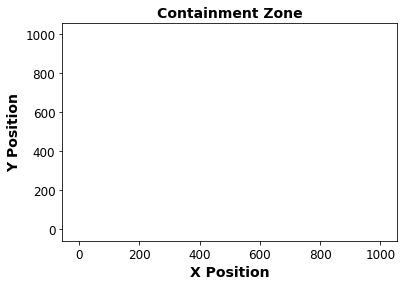

In [ ]:
##########################################################################################################################
# GPU to CPU
Position_CPU = PositionTime.cpu().detach().numpy()
# Arrange data to plot
x = Position_CPU.transpose()
y = (Infection.cpu().detach().numpy()).transpose()
##########################################################################################################################
# Animation for one week

from matplotlib import pyplot as plt


fig = plt.figure()
camera = Camera(fig)
poly = Polygon([(Containment[1],Containment[3]),(Containment[1],Containment[4]),
               (Containment[2],Containment[4]),(Containment[2],Containment[3])])
xo,yo = poly.exterior.xy
plt.xlabel('X Position',fontweight='bold',fontsize=14)
plt.ylabel('Y Position',fontweight='bold',fontsize=14)
plt.title('Containment Zone',fontweight='bold',fontsize=14)
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
for i in range(672):
 plt.plot(xo,yo,color='red')
 plt.scatter(x[2*i][y[i]==0],x[(2*i)+1][y[i]==0],edgecolor='dimgray',facecolor='None')
 plt.scatter(x[2*i][(y[i]==3)|(y[i]==1)],x[(2*i)+1][(y[i]==3)|(y[i]==1)],edgecolor='red',facecolor='None')
 plt.scatter(x[2*i][y[i]==2],x[(2*i)+1][y[i]==2],edgecolor='green',facecolor='None')
 #plt.scatter(x[2*i],x[(2*i)+1],edgecolor='dimgray',facecolor='None')
 camera.snap()
animation = camera.animate()
HTML(animation.to_html5_video())